# Using the Wisconsin breast cancer diagnostic data set for predictive analysis



## Description
    
Features are computed from a digitized image of a fine needle aspirate (FNA) of a breast mass. They describe characteristics of the cell nuclei present in the image.
n the 3-dimensional space is that described in: [K. P. Bennett and O. L. Mangasarian: "Robust Linear Programming Discrimination of Two Linearly Inseparable Sets", Optimization Methods and Software 1, 1992, 23-34].

This database is also available through the UW CS ftp server:
ftp ftp.cs.wisc.edu
cd math-prog/cpo-dataset/machine-learn/WDBC/

Also can be found on UCI Machine Learning Repository: https://archive.ics.uci.edu/ml/datasets/Breast+Cancer+Wisconsin+%28Diagnostic%29

### Attribute Information:

1) ID number

2) Diagnosis (M = malignant, B = benign)

Ten real-valued features are computed for each cell nucleus:

a) radius (mean of distances from center to points on the perimeter)

b) texture (standard deviation of gray-scale values)

c) perimeter

d) area

e) smoothness (local variation in radius lengths)

f) compactness (perimeter^2 / area - 1.0)

g) concavity (severity of concave portions of the contour)

h) concave points (number of concave portions of the contour)

i) symmetry

j) fractal dimension ("coastline approximation" - 1)

The mean, standard error and "worst" or largest (mean of the three
largest values) of these features were computed for each image,
resulting in 30 features. For instance, field 3 is Mean Radius, field
13 is Radius SE, field 23 is Worst Radius.

All feature values are recoded with four significant digits.


In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import itertools
from itertools import chain
from sklearn.feature_selection import RFE
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import VotingClassifier
from sklearn.model_selection import GridSearchCV, cross_val_score, learning_curve, train_test_split
from sklearn.metrics import precision_score, recall_score, confusion_matrix, roc_curve, precision_recall_curve, accuracy_score
import warnings
import plotly.offline as py
#py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls
import plotly.figure_factory as ff

warnings.filterwarnings('ignore') #ignore warning messages 

C:\Users\NEW\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:29: DeprecationWarning: numpy.core.umath_tests is an internal NumPy module and should not be imported. It will be removed in a future NumPy release.
  from numpy.core.umath_tests import inner1d


In [2]:
data=pd.read_csv(r"C:\Users\NEW\Desktop\ML Project\data.csv") #importing dataset


Commands below are used to see the general information about the data 

In [3]:
print(data.head(3)) # Head is used for to see top 5 by default so we used 3 so it will print 3 rows.


         id diagnosis  radius_mean  texture_mean  perimeter_mean  area_mean  \
0    842302         M        17.99         10.38           122.8     1001.0   
1    842517         M        20.57         17.77           132.9     1326.0   
2  84300903         M        19.69         21.25           130.0     1203.0   

   smoothness_mean  compactness_mean  concavity_mean  concave points_mean  \
0          0.11840           0.27760          0.3001              0.14710   
1          0.08474           0.07864          0.0869              0.07017   
2          0.10960           0.15990          0.1974              0.12790   

      ...       texture_worst  perimeter_worst  area_worst  smoothness_worst  \
0     ...               17.33            184.6      2019.0            0.1622   
1     ...               23.41            158.8      1956.0            0.1238   
2     ...               25.53            152.5      1709.0            0.1444   

   compactness_worst  concavity_worst  concave points

It is clear from above visulaization that 'Unnamed : 32' column is empty. So we are going to drop this column. Also column 'id' is unnecessary because it has no relevant information which can help to classify whether cancer is 'Beneign' or 'Maligant'.

In [4]:
data = data.drop(['Unnamed: 32','id'], axis=1) ## For deleting unncessary data.

# Data Analysis

### General information about data

In [5]:
data.head() ##checking whether data is dropped or not

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [6]:
# describing the stats of data
data.describe()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


### Target Distribution

As classification problems gives output as either '1' or '0' so we need to clasify our 'M' and 'N' into either '1' or '0'

In [7]:
data['diagnosis']=data['diagnosis'].map({'M':1,'B':0})

In the above command we have mapped M value to 1 and B value to 0 which means 1 represent malignant and 0 represent benign.

In [8]:
x=list(data['diagnosis']);
print("Malignant")
print(x.count(1))
print("Benign")
print(x.count(0))

Malignant
212
Benign
357


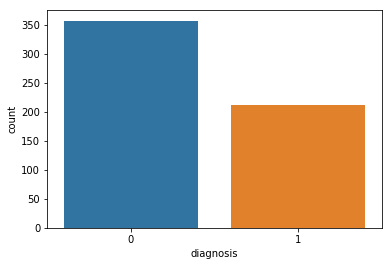

In [9]:
sns.countplot(data['diagnosis'],label='count')

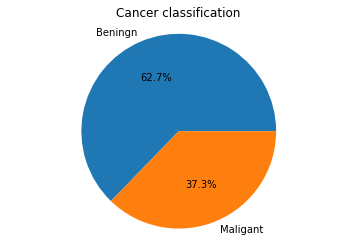

In [10]:
%matplotlib inline

# Pie chart, where the slices will be ordered and plotted counter-clockwise:
labels = ['Beningn','Maligant']
sizes = [357, 212]


fig, ax = plt.subplots()
ax.pie(sizes, labels=labels, autopct='%1.1f%%')
ax.axis('equal')  # Equal aspect ratio ensures the pie chart is circular.
ax.set_title('Cancer classification')
plt.show()

In [11]:
import plotly.figure_factory as figure
T = data[(data['diagnosis'] != 0)]
F = data[(data['diagnosis'] == 0)]
def visualization(data_select, size_bin) :  
    tmp1 = T[data_select]
    tmp2 = F[data_select]
    hist_data = [tmp1, tmp2]
    
    group_labels = ['malignant', 'benign']
    colors = ['#636EFA', '#00CC96']

    fig = figure.create_distplot(hist_data, group_labels, colors = colors, show_hist = True, bin_size = size_bin, curve_type='kde')
    
    fig['layout'].update(title = data_select)

    py.iplot(fig, filename = 'Density plot')

Calling function defined above for visualing our plots

## Visualization plots for mean

In [12]:

visualization('radius_mean', .5)
visualization('texture_mean', .5)
visualization('perimeter_mean', 5)
visualization('area_mean', 10) 
visualization('smoothness_mean', .5)
visualization('compactness_mean', .5)
visualization('concavity_mean' ,.5)
visualization('concave points_mean', .5)
visualization('symmetry_mean', .5)
visualization('fractal_dimension_mean', .5)



## Visualization plots for Standard error

In [13]:
visualization('radius_se', .1)
visualization('texture_se', .1)
visualization('perimeter_se', .5)
visualization('area_se', 5)
visualization('smoothness_se', .5)
visualization('compactness_se', .5)
visualization('concavity_se', .5)
visualization('concave points_se', .5)
visualization('symmetry_se', .5)
visualization('fractal_dimension_se', .5)


## Visualization plots for worst values

In [14]:
visualization('radius_worst', .5)
visualization('texture_worst', .5)
visualization('perimeter_worst', 5)
visualization('area_worst', 10)
visualization('smoothness_worst', .5)
visualization('compactness_worst', .5)
visualization('concavity_worst', .5)
visualization('concave points_worst', .5)
visualization('symmetry_worst', .5)
visualization('fractal_dimension_worst', .5)


# Correlation Matrices and Feature Selection

In [ ]:
# Separating features in respective categories
features_all=list(data.columns[1:31])
features_mean= list(data.columns[1:11])
features_se= list(data.columns[11:20])
features_worst=list(data.columns[21:31])
print(features_mean)
print("-----------------------------------")
print(features_se)
print("------------------------------------")
print(features_worst)

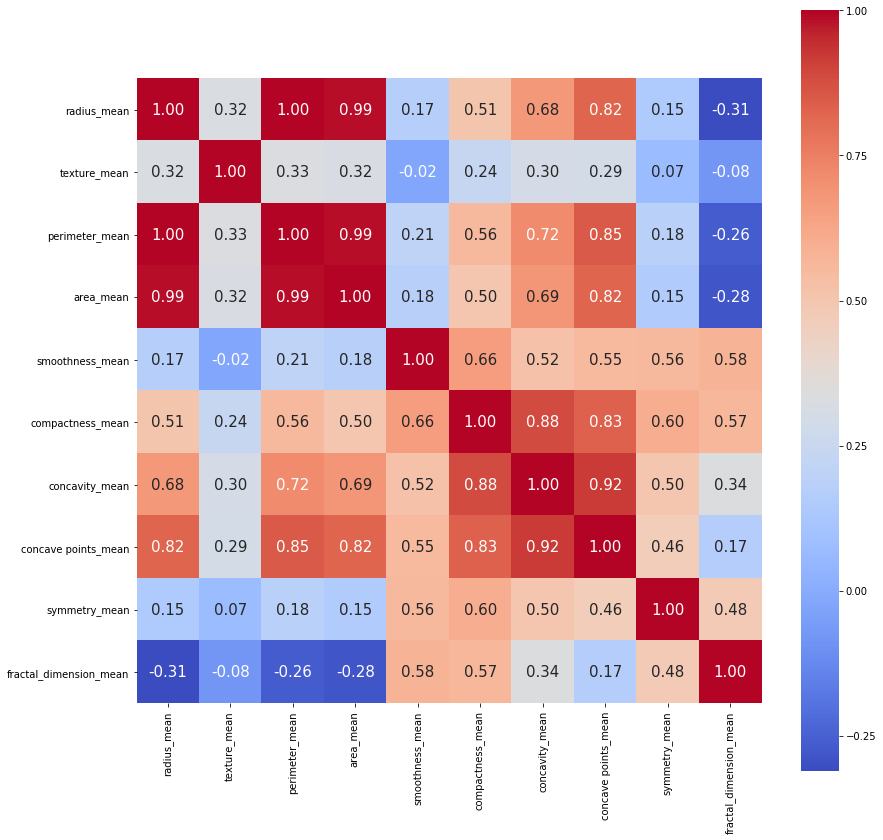

In [30]:
#correlation matrix for features_mean
corr = data[features_mean].corr() # .corr is used for find corelation
plt.figure(figsize=(14,14))
sns.heatmap(corr, cbar = True,  square = True, annot=True, fmt= '.2f',annot_kws={'size': 15}, xticklabels= features_mean, yticklabels= features_mean, cmap= 'coolwarm')

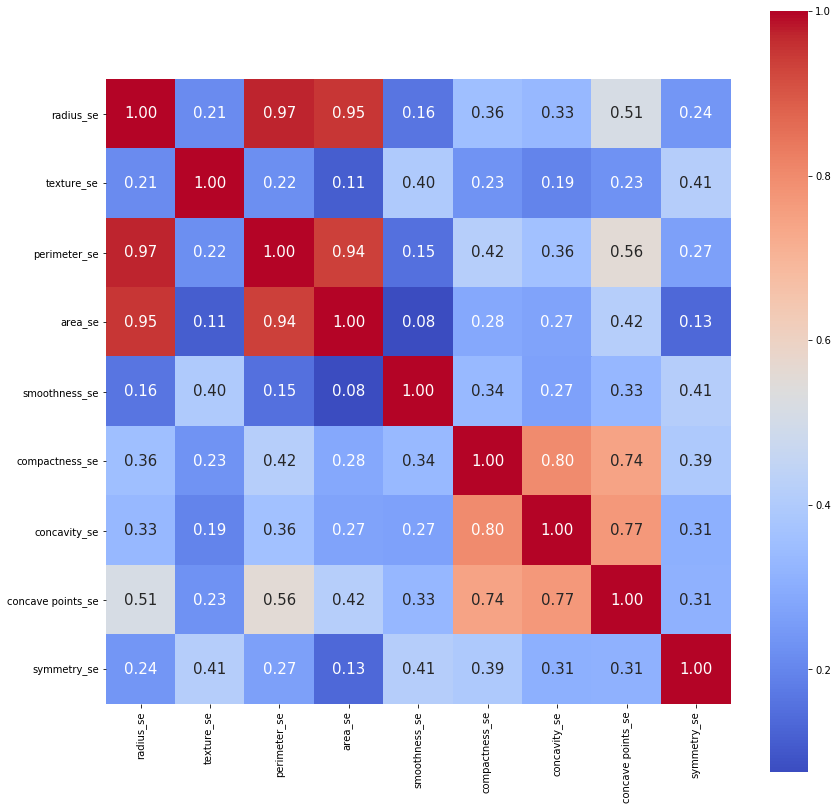

In [31]:
#correlation matrix for features_se 
corr = data[features_se].corr() # .corr is used for find corelation
plt.figure(figsize=(14,14))
sns.heatmap(corr, cbar = True,  square = True, annot=True, fmt= '.2f',annot_kws={'size': 15}, xticklabels= features_se, yticklabels= features_se, cmap= 'coolwarm')

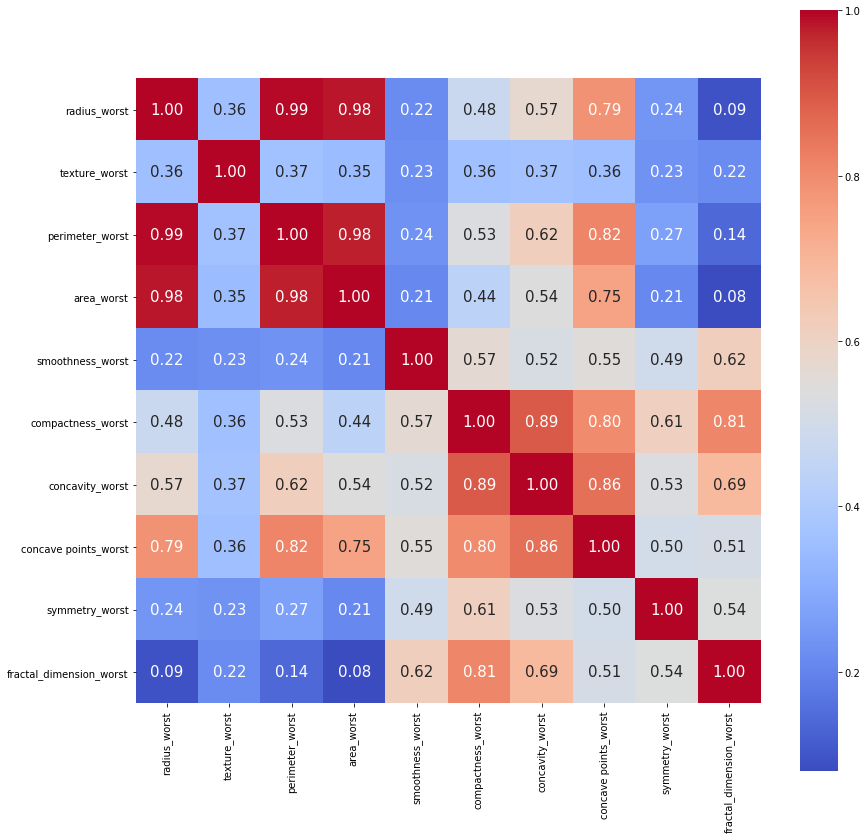

In [32]:
#correlation matrix for features_worst
corr = data[features_worst].corr() # .corr is used for find corelation
plt.figure(figsize=(14,14))
sns.heatmap(corr, cbar = True,  square = True, annot=True, fmt= '.2f',annot_kws={'size': 15}, xticklabels= features_worst, yticklabels= features_worst, cmap= 'coolwarm')

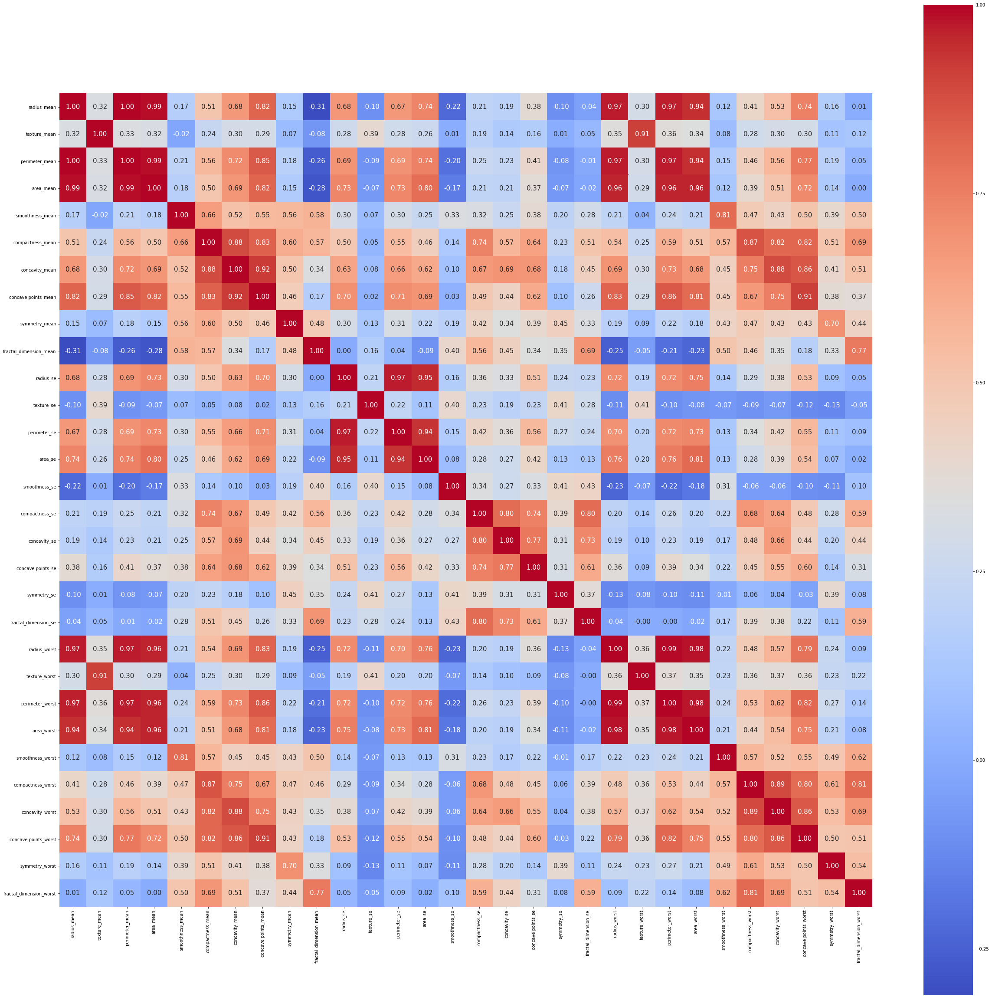

In [33]:
#correlation matrix for all features
corr = data[features_all].corr() # .corr is used for find corelation
plt.figure(figsize=(42,42))
sns.heatmap(corr, cbar = True,  square = True, annot=True, fmt= '.2f',annot_kws={'size': 15}, xticklabels= features_all, yticklabels= features_all, cmap= 'coolwarm')

In [59]:
# Observation from above correlation matrix:
# -> features radius_mean, perimeter_mean, area_mean, radius_worst, perimeter_worst, area_worst have high correlation amongst themselves so we choose radius_mean as the feature for modelling 
# -> features radius_se, perimeter_se, area_se have high correlation so we choose radius_se as the feature for modelling
# -> features texture_mean and texture_worst have high correlation so we choose texture_mean as the feature for modelling
# -> features concavity_mean, concave points_mean and concave points_worst have high correlation amongst themselves so we choose concave points_mean as the feature for modelling

In [ ]:
# Hence the features used for modelling are:
prediction_features= ['radius_mean', 'texture_mean', 'concave points_mean', 'radius_se', 'smoothness_mean', 'compactness_mean', 'symmetry_mean', 'fractal_dimension_mean', 'texture_se', 'smoothness_se', 'concavity_se', 'concave points_se', 'symmetry_se', 'fractal_dimension_se', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 'symmetry_worst', 'fractal_dimension_worst']
# Total 19 features (reduced from 30 features)

## Scatter Plots for data visualization

In [34]:
#User defined function for plotting
M = data[(data['diagnosis'] != 0)]
B = data[(data['diagnosis'] == 0)]
def plot_feat1_feat2(feat1, feat2) :  
    trace0 = go.Scatter(x = M[feat1], y = M[feat2], name = 'malignant', mode = 'markers', marker = dict(color = '#CC0000', line = dict(width = 1)))
    trace1 = go.Scatter(x = B[feat1], y = B[feat2], name = 'benign', mode = 'markers', marker = dict(color = '#0000CC', line = dict(width = 1)))
    layout = dict(title = feat1 +" "+"vs"+" "+ feat2, yaxis = dict(title = feat2,zeroline = False), xaxis = dict(title = feat1, zeroline = False))
    plots = [trace0, trace1]
    fig = dict(data = plots, layout=layout)
    py.iplot(fig)

###### Plotting some highly correlated feature pairs

In [35]:
plot_feat1_feat2('perimeter_mean','radius_worst') #pair with correlation = 0.97 

In [36]:
plot_feat1_feat2('perimeter_mean','area_mean') #pair with correlation = 0.99

In [37]:
plot_feat1_feat2('concave points_mean','concave points_worst') #pair with correlation = 0.91

###### Plotting some uncorrelated feature pairs

In [38]:
plot_feat1_feat2('smoothness_mean','texture_worst') #pair with correlation = 0.04

In [39]:
plot_feat1_feat2('area_worst','fractal_dimension_worst') #pair with correlation = 0.08

In [40]:
plot_feat1_feat2('symmetry_se','concavity_worst') #pair with correlation = 0.04

##### Plotting some negatively correlated feature pairs

In [41]:
plot_feat1_feat2('radius_mean','fractal_dimension_mean') #pair with correlation = -0.31

In [42]:
plot_feat1_feat2('area_mean','smoothness_se') #pair with correlation = -0.17

In [43]:
plot_feat1_feat2('radius_worst','fractal_dimension_mean') #pair with correlation = -0.25

## Data Analysis for feature selection

Normalising our inputs because some of the columns have range from 0-1000

In [47]:
y=data.diagnosis.values
x_data = data.drop(['diagnosis'], axis=1)
# %% normalisation
x = (x_data -np.min(x_data))/(np.max(x_data)-np.min(x_data)).values
x.head()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,0.521037,0.022658,0.545989,0.363733,0.593753,0.792037,0.703140,0.731113,0.686364,0.605518,...,0.620776,0.141525,0.668310,0.450698,0.601136,0.619292,0.568610,0.912027,0.598462,0.418864
1,0.643144,0.272574,0.615783,0.501591,0.289880,0.181768,0.203608,0.348757,0.379798,0.141323,...,0.606901,0.303571,0.539818,0.435214,0.347553,0.154563,0.192971,0.639175,0.233590,0.222878
2,0.601496,0.390260,0.595743,0.449417,0.514309,0.431017,0.462512,0.635686,0.509596,0.211247,...,0.556386,0.360075,0.508442,0.374508,0.483590,0.385375,0.359744,0.835052,0.403706,0.213433
3,0.210090,0.360839,0.233501,0.102906,0.811321,0.811361,0.565604,0.522863,0.776263,1.000000,...,0.248310,0.385928,0.241347,0.094008,0.915472,0.814012,0.548642,0.884880,1.000000,0.773711
4,0.629893,0.156578,0.630986,0.489290,0.430351,0.347893,0.463918,0.518390,0.378283,0.186816,...,0.519744,0.123934,0.506948,0.341575,0.437364,0.172415,0.319489,0.558419,0.157500,0.142595


Splitting our data through Train Test Split method from sklearn library which divides data into test and training set. Using random_state input so that our training data won't change.Rignt now we categorised 30 percent of our dataset into test and 70 percent into training dataset

In [48]:
# %%train test split
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)


print("x train: ",x_train.shape)
print("x test: ",x_test.shape)
print("y train: ",y_train.shape)
print("y test: ",y_test.shape)


x train:  (398, 30)
x test:  (171, 30)
y train:  (398,)
y test:  (171,)


## Applying KNN Algorithm


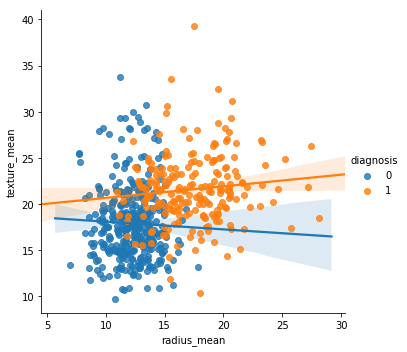

In [49]:
sns.lmplot(x = 'radius_mean', y= 'texture_mean', hue = 'diagnosis',data = data)


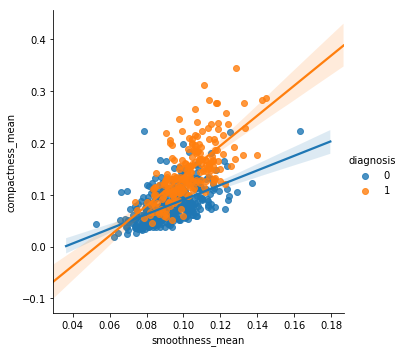

In [50]:
sns.lmplot(x='smoothness_mean', y = 'compactness_mean', data = data, hue = 'diagnosis')

In [51]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors = 13)
knn.fit(x_train,y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=1, n_neighbors=13, p=2,
           weights='uniform')

In [52]:
knn.score(x_test,y_test)


0.9707602339181286

In [53]:
neighbors = []
cv_scores = []
from sklearn.model_selection import cross_val_score
#perform 10 fold cross validation
for k in range(1,51,2):
    neighbors.append(k)
    knn = KNeighborsClassifier(n_neighbors = k)
    scores = cross_val_score(knn,x_train,y_train,cv=10, scoring = 'accuracy')
    cv_scores.append(scores.mean())
    

The optimal number of neighbors is 5 


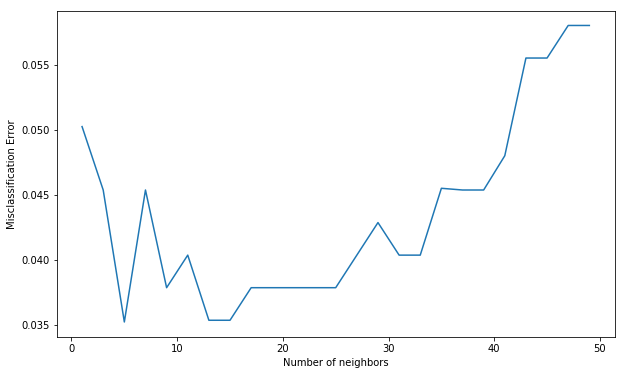

In [54]:
#Misclassification error versus k
MSE = [1-x for x in cv_scores]

#determining the best k
optimal_k = neighbors[MSE.index(min(MSE))]
print('The optimal number of neighbors is %d ' %optimal_k)

#plot misclassification error versus k

plt.figure(figsize = (10,6))
plt.plot(neighbors, MSE)
plt.xlabel('Number of neighbors')
plt.ylabel('Misclassification Error')
plt.show()


## Applying Logistic Regression

In [55]:
from sklearn.linear_model import LogisticRegression
lr=LogisticRegression()
lr.fit(x_train,y_train)
lr_ac=lr.score(x_test,y_test)
print("Accuracy of logistic regression is: {}".format(lr_ac))

Accuracy of logistic regression is: 0.9649122807017544


In [56]:
#let's see the confusion matrix (True positives,True negatives, False positives,False negatives)
from sklearn.metrics import confusion_matrix
y_predict_lr=lr.predict(x_test)
cm_lr=confusion_matrix(y_test,y_predict_lr)
cm_lr


array([[107,   1],
       [  5,  58]], dtype=int64)

In [57]:
#let's see first on table
rfcm_lr= pd.DataFrame(cm_lr,index=["Real Benign Tumors","Real Malign Tumors"],columns=["Test says Benign Tumor","Test says Malign Tumor"])
rfcm_lr


,Test says Benign Tumor,Test says Malign Tumor
Real Benign Tumors,107,1
Real Malign Tumors,5,58


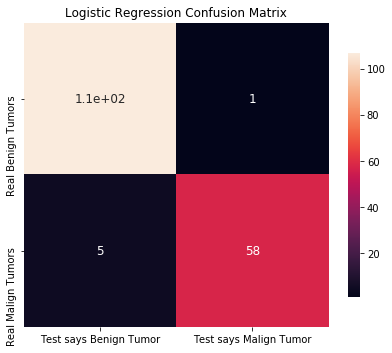


Accuracy of logistic regression is: 0.9649122807017544


In [58]:

fig = plt.figure(figsize = (15,15)) 

ax2 = fig.add_subplot(1, 2, 2)

sns.heatmap(data=rfcm_lr, ax=ax2,  square=True, cbar_kws={'shrink': .3}, annot=True, annot_kws={'fontsize': 12})

ax2.set_title("Logistic Regression Confusion Matrix")
plt.show(fig)

print("\nAccuracy of logistic regression is: {}".format(lr_ac))
